<a href="https://colab.research.google.com/github/SowmyaDontha88/Resume-Screening-Using-NLP/blob/main/Data_Preprocessing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 1] Import Dependencies

In [ ]:
import pandas as pd
import numpy as np

pd.set_option('display.max_rows', None)

#regular expression
import re, os
import io
#!pip install constants


# for all NLP related operations on text
import nltk
from nltk.tokenize import word_tokenize, sent_tokenize, RegexpTokenizer
from nltk.stem import WordNetLemmatizer,PorterStemmer
from nltk.stem.snowball import SnowballStemmer
from nltk.stem.porter import *
from nltk.stem.porter import PorterStemmer
from wordcloud import WordCloud, STOPWORDS
from nltk.corpus import stopwords
from collections import Counter
lemmatizer = WordNetLemmatizer()
stemmer = PorterStemmer()
nltk.download('wordnet')
nltk.download('stopwords')
nltk.download('punkt')
stop = stopwords.words('english')

from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from tqdm.notebook import tqdm_notebook

import spacy
from spacy.matcher import Matcher
##Part Of Speech Tagging
nlp = spacy.load('en_core_web_sm')
import constants as cs

# To identify the sentiment of text
from textblob import TextBlob
from textblob.sentiments import NaiveBayesAnalyzer
from textblob.np_extractors import ConllExtractor


# ignoring all the warnings
import warnings
warnings.filterwarnings('ignore')
warnings.filterwarnings("ignore", category=DeprecationWarning)

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


# 2] Load Dataset

In [ ]:
df= pd.read_csv('/content/Resume data.csv').drop('Unnamed: 0',axis= 1)
df.head()

,Category,Resume,Name,Education,DateOfBirth,Email,Phone,Experience,Skills,Links,PreviousWorkExperience
0,Internship,Name Ravali P Curriculum Vitae Specialization ...,Ravali,-,04/11/1995,-,-,20.00,NaN,-,Not Found
1,Internship,SUSOVAN BAG Seeking a challenging position in...,NaN,-,NaN,-,-,20.00,NaN,-,Not Found
2,SQL Developer,ANIL KUMAR MADDUKURI SQL MSBI Developer Summar...,NaN,-,NaN,-,-,2.40,"SQL, ETL, Stored Procedures",-,in MS SQL Server (SSMS) and creating SSIS pack...
3,SQL Developer,Aradhana Tripathi Current Location Gachibowli...,NaN,-,NaN,-,-,4.00,"SQL, Stored Procedures, Database Management, D...",-,of working experience in information technolog...
4,SQL Developer,BUDDHA VAMSI CAREER OBJECTIVE Have 2 11 years ...,Buddha,-,22-08-1994,-,-,2.11,"SQL, ETL, Stored Procedures",-,of IT experience as Database Engineer and curr...


# 3] Exploratory Data Analysis

In [ ]:
print('We have {} rows and {} columns in the dataset'.format(df.shape[0],df.shape[1]))

We have 76 rows and 11 columns in the dataset


In [ ]:
df.isnull().sum()

Category                   0
Resume                     0
Name                      52
Education                  0
DateOfBirth               70
Email                      0
Phone                      0
Experience                 5
Skills                     3
Links                      0
PreviousWorkExperience     0
dtype: int64

In [ ]:
df.duplicated().sum()

0

In [ ]:
df.columns

Index(['Category', 'Resume', 'Name', 'Education', 'DateOfBirth', 'Email',
       'Phone', 'Experience', 'Skills', 'Links', 'PreviousWorkExperience'],
      dtype='object')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 76 entries, 0 to 75
Data columns (total 11 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Category                76 non-null     object 
 1   Resume                  76 non-null     object 
 2   Name                    24 non-null     object 
 3   Education               76 non-null     object 
 4   DateOfBirth             6 non-null      object 
 5   Email                   76 non-null     object 
 6   Phone                   76 non-null     object 
 7   Experience              71 non-null     float64
 8   Skills                  73 non-null     object 
 9   Links                   76 non-null     object 
 10  PreviousWorkExperience  76 non-null     object 
dtypes: float64(1), object(10)
memory usage: 6.7+ KB


# 4] Text Pre-processing

## 4.1] Analyse Category column

In [ ]:
# for visulization
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('darkgrid')
import plotly.express as px
import plotly.graph_objects as go

In [ ]:
fig = go.Figure(go.Pie(labels = df['Category'].value_counts().index,
                       values = df['Category'].value_counts(),
                       hole = 0.5))
fig.show()

## 4.2] Analysing Resume column

### 4.2.1] Number of Words in Resume Column

In [ ]:
df1 = pd.DataFrame(df['Resume'])

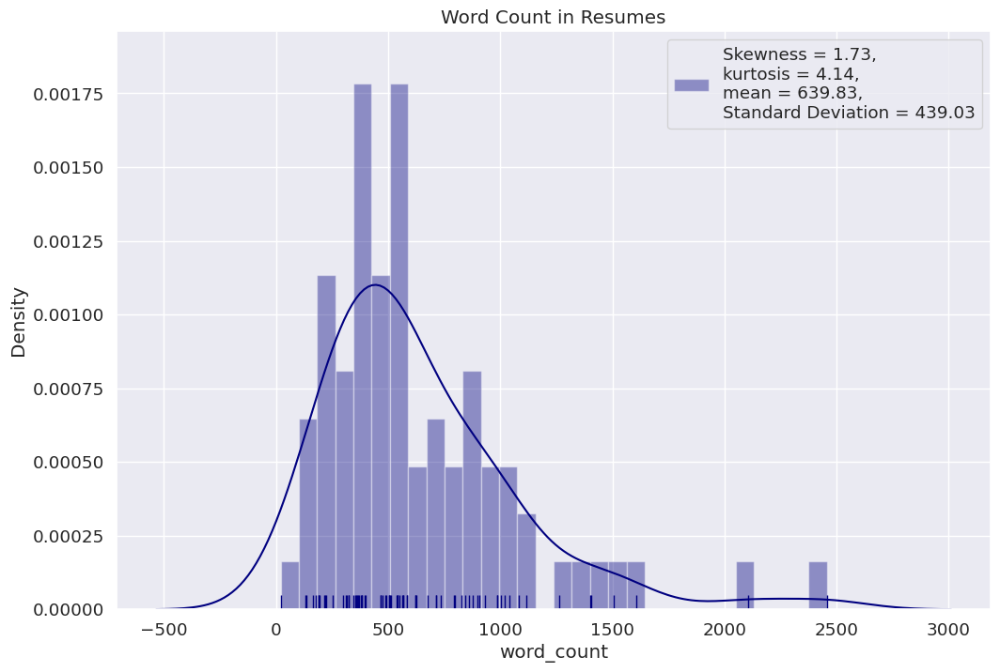

In [ ]:
df1['word_count'] = df1['Resume'].apply(lambda x: len(str(x).split(" ")))

skew = df1['word_count'].skew()
kurt = df1['word_count'].kurt()
mean = df1['word_count'].mean()
std = df1['word_count'].std()

plt.figure(figsize=(12,8))
sns.set(font_scale=1.2)
sns.distplot(df1["word_count"],
             kde= True, color = 'navy',rug=True,
             label='Skewness = {:.2f},\nkurtosis = {:.2f},\nmean = {:.2f},\nStandard Deviation = {:.2f}'
             .format(skew, kurt, mean, std), bins=30).set(title='Word Count in Resumes')
plt.legend(loc='best')
plt.show()

### 4.2.2] Number of characters in Resume Column

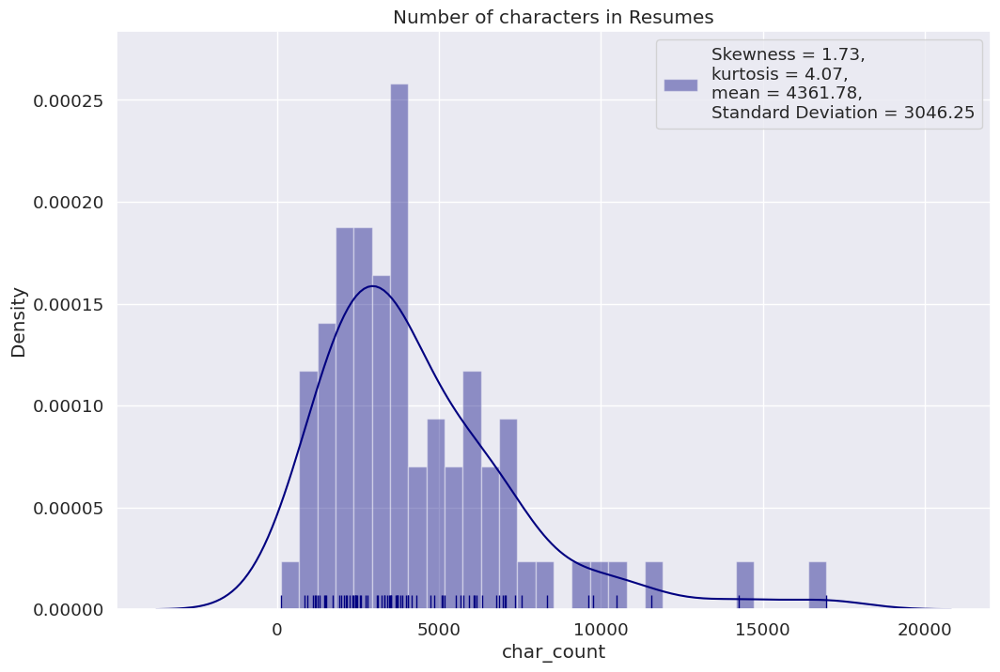

In [ ]:
df1['char_count'] = df1['Resume'].str.len()
# including spaces

skew = df1['char_count'].skew()
kurt = df1['char_count'].kurt()
mean = df1['char_count'].mean()
std = df1['char_count'].std()

plt.figure(figsize=(12,8))
sns.set(font_scale=1.2)
sns.distplot(df1["char_count"],
             kde= True, color = 'navy',rug=True,
             label='Skewness = {:.2f},\nkurtosis = {:.2f},\nmean = {:.2f},\nStandard Deviation = {:.2f}'
             .format(skew, kurt, mean, std), bins=30).set(title='Number of characters in Resumes')
plt.legend(loc='best')
plt.show()

### 4.2.3] Average Word Length in Resume column

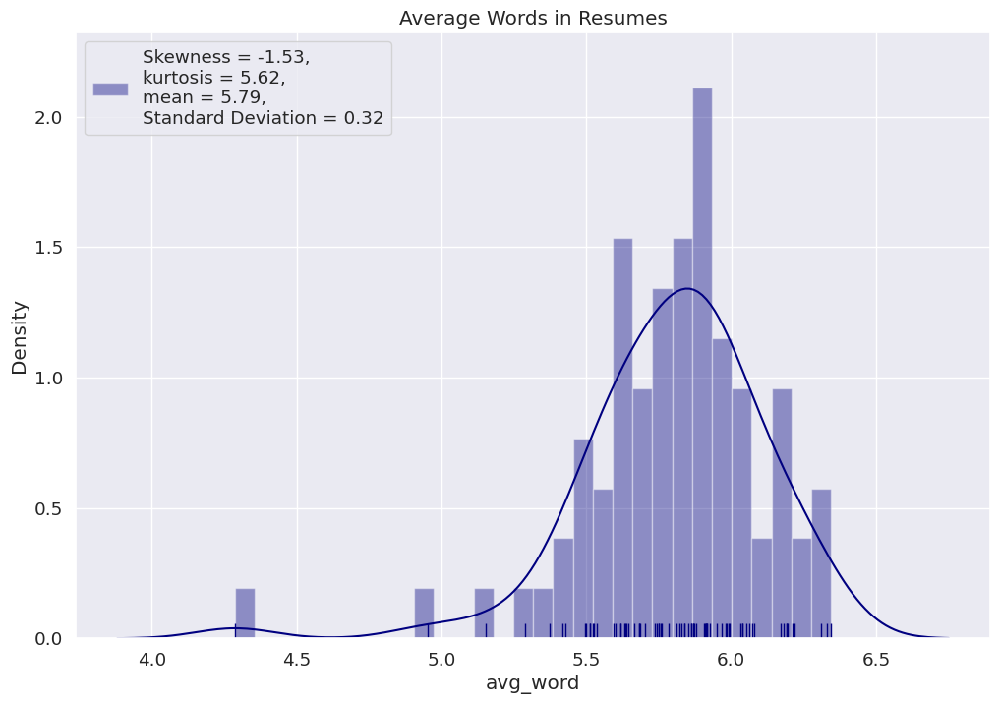

In [ ]:
# function for average

def avg_word(sentence):
    words = sentence.split()
    return (sum(len(word) for word in words)/len(words))


df1['avg_word'] = df1['Resume'].apply(lambda x: avg_word(x))

skew = df1['avg_word'].skew()
kurt = df1['avg_word'].kurt()
mean = df1['avg_word'].mean()
std = df1['avg_word'].std()

plt.figure(figsize=(12,8))
sns.set(font_scale=1.2)
sns.distplot(df1["avg_word"],
             kde= True, color = 'navy',rug=True,
             label='Skewness = {:.2f},\nkurtosis = {:.2f},\nmean = {:.2f},\nStandard Deviation = {:.2f}'
             .format(skew, kurt, mean, std), bins=30).set(title='Average Words in Resumes')

plt.legend(loc='best')
plt.show()

### 4.2.4] Number of stopwords in Resume column

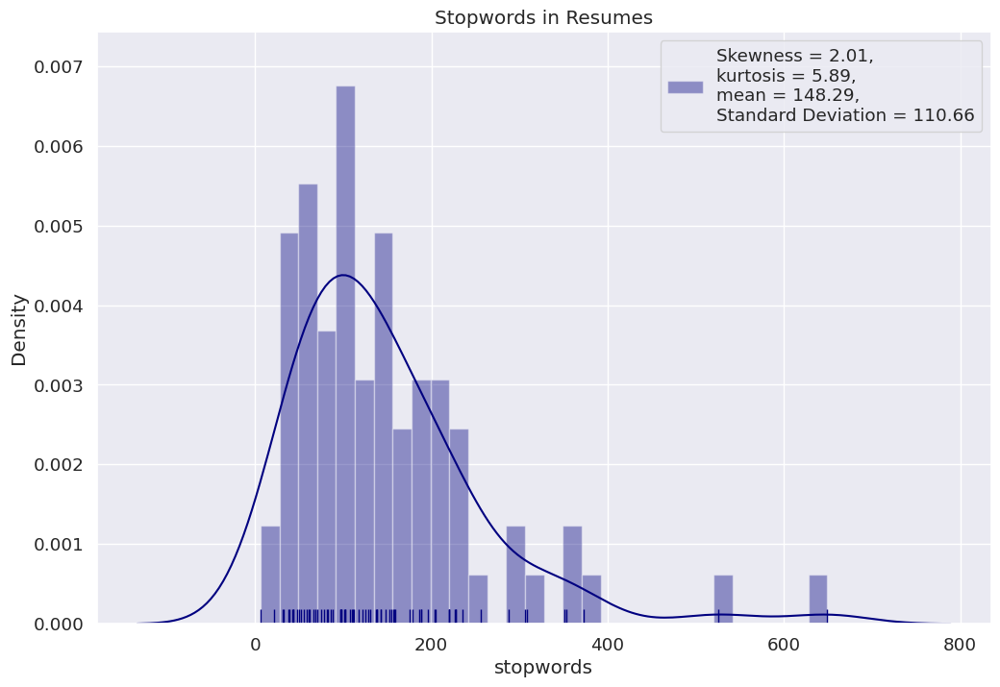

In [ ]:
df1['stopwords'] = df1['Resume'].apply(lambda x: len([x for x in x.split() if x in stop]))

skew = df1['stopwords'].skew()
kurt = df1['stopwords'].kurt()
mean = df1['stopwords'].mean()
std = df1['stopwords'].std()
plt.figure(figsize=(12,8))
sns.set(font_scale=1.2)
sns.distplot(df1["stopwords"],
             kde= True, color = 'navy',rug=True,
             label='Skewness = {:.2f},\nkurtosis = {:.2f},\nmean = {:.2f},\nStandard Deviation = {:.2f}'
             .format(skew, kurt, mean, std), bins=30).set(title='Stopwords in Resumes')
plt.legend(loc='best')
plt.show()

### 4.2.5] Number of numerics in Resume column

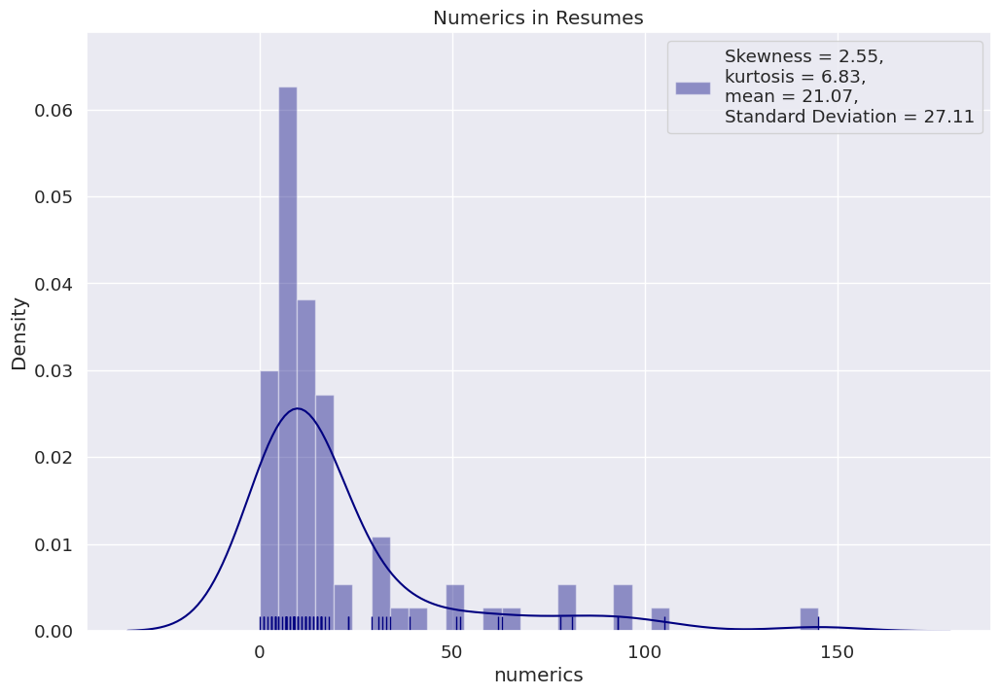

In [ ]:
df1['numerics'] = df1['Resume'].apply(lambda x: len([x for x in x.split() if x.isdigit()]))

skew = df1['numerics'].skew()
kurt = df1['numerics'].kurt()
mean = df1['numerics'].mean()
std = df1['numerics'].std()
plt.figure(figsize=(12,8))
sns.set(font_scale=1.2)
sns.distplot(df1["numerics"],
             kde= True, color = 'navy',rug=True,
             label='Skewness = {:.2f},\nkurtosis = {:.2f},\nmean = {:.2f},\nStandard Deviation = {:.2f}'
             .format(skew, kurt, mean, std), bins=30).set(title='Numerics in Resumes')
plt.legend(loc='best')
plt.show()

### 4.2.6] Number of Uppercase words in Resume column

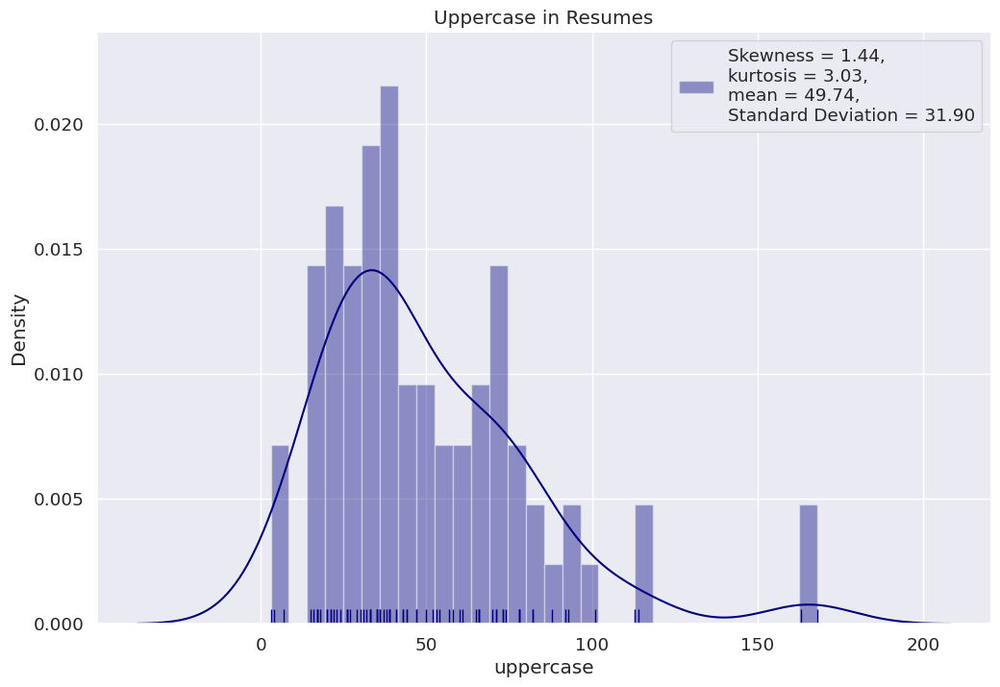

In [ ]:
df1['uppercase'] = df1['Resume'].apply(lambda x: len([x for x in x.split() if x.isupper()]))

skew = df1['uppercase'].skew()
kurt = df1['uppercase'].kurt()
mean = df1['uppercase'].mean()
std = df1['uppercase'].std()
plt.figure(figsize=(12,8))
sns.set(font_scale=1.2)
sns.distplot(df1["uppercase"],
             kde= True, color = 'navy',rug=True,
             label='Skewness = {:.2f},\nkurtosis = {:.2f},\nmean = {:.2f},\nStandard Deviation = {:.2f}'
             .format(skew, kurt, mean, std), bins=30).set(title='Uppercase in Resumes')
plt.legend(loc='best')
plt.show()

In [ ]:
df1.to_csv('Resume word counts.csv', index=False)

In [ ]:
df1 = pd.read_csv('Resume word counts.csv')
df1

,Resume,word_count,char_count,avg_word,stopwords,numerics,uppercase
0,Name Ravali P Curriculum Vitae Specialization ...,299,2060,5.912752,61,7,43
1,SUSOVAN BAG Seeking a challenging position in...,191,1254,5.629630,38,8,44
2,ANIL KUMAR MADDUKURI SQL MSBI Developer Summar...,627,4159,5.643770,125,9,47
3,Aradhana Tripathi Current Location Gachibowli...,713,4851,5.821378,148,15,66
4,BUDDHA VAMSI CAREER OBJECTIVE Have 2 11 years ...,223,1480,5.666667,39,12,36
5,KAMBALLA PRADEEP SYNOPSIS Looking forward to a...,253,1731,5.869048,62,7,26
6,Hyderabad Nazeer Basha SQL and Power BI Devel...,1118,7365,5.593554,288,16,78
7,Resume Name Neeraj Mishra Having 3 year 6 Mon...,622,4047,5.525806,152,9,60
8,SQL DEVELOPER Name Bandi prem sai Willing to w...,550,3705,5.748634,130,13,37
9,SQL SERVER DEVELOPER Priyanka L Professional ...,468,3115,5.682403,102,12,114


# 4.3] Lemmatization & Stemming
- Removed stopwords
- Removed Punctuations
- Lowered case
- Tokenized with regular expressions

In [ ]:
def preprocess(text):
    text = str(text)
    text = text.lower()
    clean_text = re.compile('<.*?>')
    cleantext = re.sub(clean_text, '', text)
    url=re.sub(r'http\S+', '',cleantext)
    num = re.sub('[0-9]+', '', url)

    tokenizer = RegexpTokenizer(r'\w+')
    tokens = tokenizer.tokenize(num)
    filtered_words = [w for w in tokens
                      if len(w) > 2
                      if not w in stopwords.words('english')]

    stem_words=[stemmer.stem(w) for w in filtered_words]
    lemma_words=[lemmatizer.lemmatize(w) for w in stem_words]
    return " ".join(filtered_words)

In [ ]:
df['Resume'][1]

' SUSOVAN BAG Seeking a challenging position in the field of science and technology to utilize my skills for organization and individual growth and to enhance my knowledge from my academic learning to give my best to the organization SKILLS CCNA Routing Switching subnetting Programming C C Java HTML CSS SQL OOPS Algorithms Data Structures DBMS Networking OS Linux Linux System Administration with Troubleshooting SOFT SKILLS Leadership Collaboration Good communication and customer Handling skills LANGUAGES English Fluent Hindi Fluent Bengali Native Telugu PROJECTS SMART AGRICULTURE Built a product for farmers using IoT as a solution AUTOMATIC WATER MOTOR CONTROLLER 2019 2020 IoT android and API technologies combined to automate work of water motor controllers using sensors BOOKSTORE MANAGEMENT INTERFACE C PP 2018 2019 Manage the purchase and return of books in a books store HOTEL MANAGEMENT SYSTEM DEC 2018 Designed a front end module for the hotel management system website using HTML CSS

In [ ]:
df3 = df['Resume'].apply(lambda x: preprocess(x))
df3[1]

'susovan bag seeking challenging position field science technology utilize skills organization individual growth enhance knowledge academic learning give best organization skills ccna routing switching subnetting programming java html css sql oops algorithms data structures dbms networking linux linux system administration troubleshooting soft skills leadership collaboration good communication customer handling skills languages english fluent hindi fluent bengali native telugu projects smart agriculture built product farmers using iot solution automatic water motor controller iot android api technologies combined automate work water motor controllers using sensors bookstore management interface manage purchase return books books store hotel management system dec designed front end module hotel management system website using html css online movie ticket booking designed fully functioning website using html css javascript education background lovely professional university punjab india 

In [ ]:
df3= pd.DataFrame()
df3 = df[['Resume', 'Category']].rename(columns ={'Resume':'Raw_data'})
df3['Cleaned_data'] = df['Resume'].apply(lambda x: preprocess(x))
df3.head()

,Raw_data,Category,Cleaned_data
0,Name Ravali P Curriculum Vitae Specialization ...,Internship,name ravali curriculum vitae specialization co...
1,SUSOVAN BAG Seeking a challenging position in...,Internship,susovan bag seeking challenging position field...
2,ANIL KUMAR MADDUKURI SQL MSBI Developer Summar...,SQL Developer,anil kumar maddukuri sql msbi developer summar...
3,Aradhana Tripathi Current Location Gachibowli...,SQL Developer,aradhana tripathi current location gachibowli ...
4,BUDDHA VAMSI CAREER OBJECTIVE Have 2 11 years ...,SQL Developer,buddha vamsi career objective years experience...


# 4.4] Text visualization using Wordcloud

- ### Most common words in different Job categories in the resumes can be observed by WordCloud

In [ ]:
import string


oneSetOfStopWords = set(stopwords.words('english')+['``',"''"])
totalWords =[]
Sentences = df3['Cleaned_data'].values
cleanedSentences = ""

for records in Sentences:
    cleanedText = preprocess(records)
    cleanedSentences += cleanedText
    requiredWords = nltk.word_tokenize(cleanedText)
    for word in requiredWords:
        if word not in oneSetOfStopWords and word not in string.punctuation:
            totalWords.append(word)


wordfreqdist = nltk.FreqDist(totalWords)
mostcommon = wordfreqdist.most_common(50)
print(mostcommon)

[('experience', 552), ('peoplesoft', 391), ('workday', 367), ('using', 355), ('application', 350), ('server', 326), ('reports', 309), ('data', 299), ('project', 257), ('business', 248), ('sql', 234), ('process', 219), ('database', 214), ('knowledge', 199), ('web', 193), ('worked', 185), ('integrations', 175), ('involved', 171), ('integration', 168), ('like', 163), ('good', 159), ('client', 159), ('creating', 156), ('system', 155), ('support', 149), ('servers', 148), ('hcm', 147), ('working', 146), ('development', 144), ('skills', 142), ('tools', 140), ('various', 139), ('report', 138), ('testing', 137), ('technical', 131), ('created', 128), ('production', 128), ('team', 127), ('issues', 126), ('people', 123), ('security', 121), ('design', 119), ('management', 118), ('domains', 115), ('eib', 115), ('responsibilities', 114), ('environment', 113), ('oracle', 113), ('services', 111), ('custom', 111)]


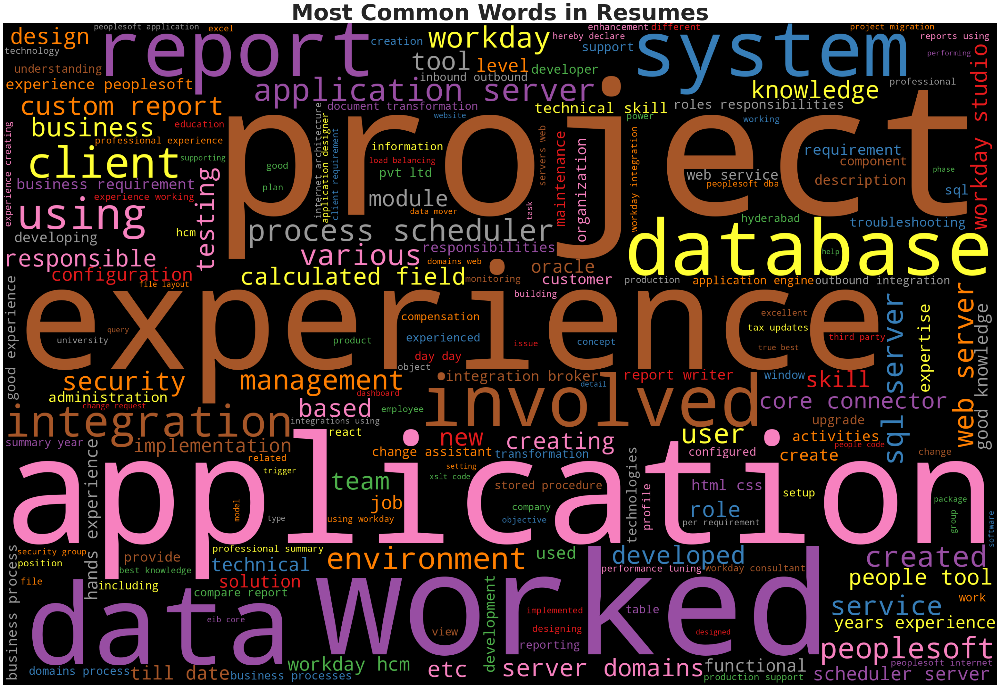

In [ ]:
from wordcloud import WordCloud

# Define a function to plot word cloud
def plot_cloud(wordcloud):
    plt.figure(figsize=(40,30))
    plt.imshow(wordcloud)
    plt.title('Most Common Words in Resumes', fontsize = 50, fontweight = 'bold')
    plt.axis('off')
    plt.show()


wordcloud=WordCloud(width=3000,height=2000, background_color='black',
                    max_words=200, colormap='Set1').generate(cleanedSentences)

plot_cloud(wordcloud)

- ### Observe Wordcloud for each job category

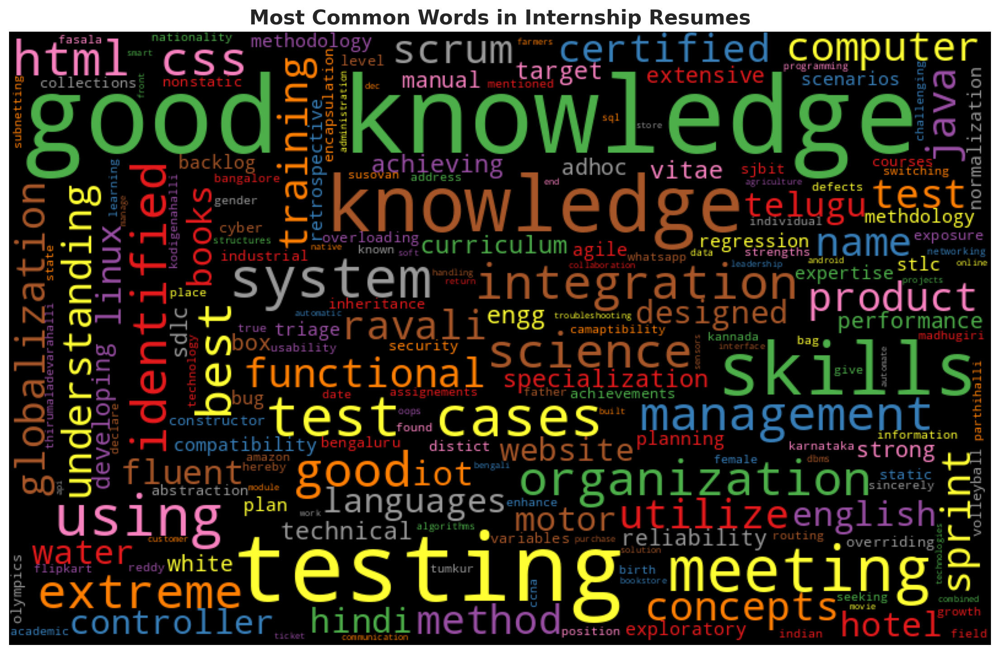

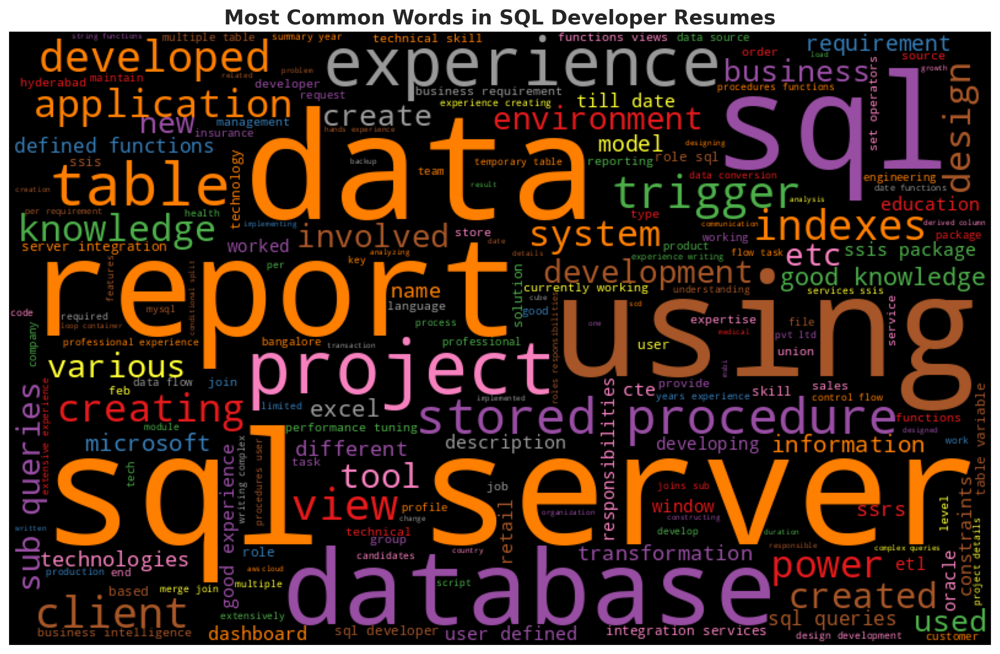

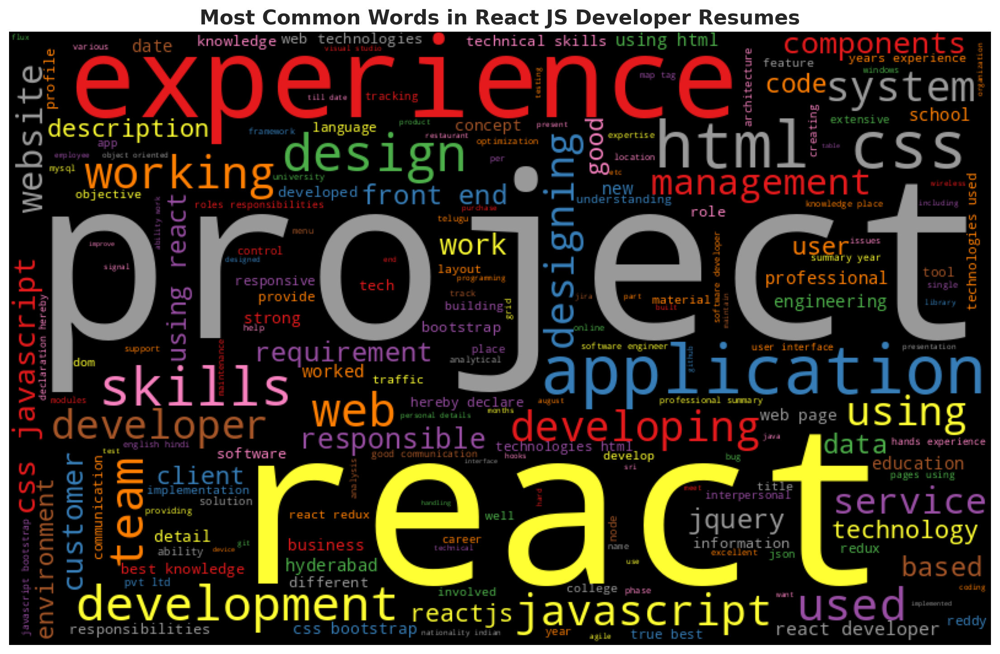

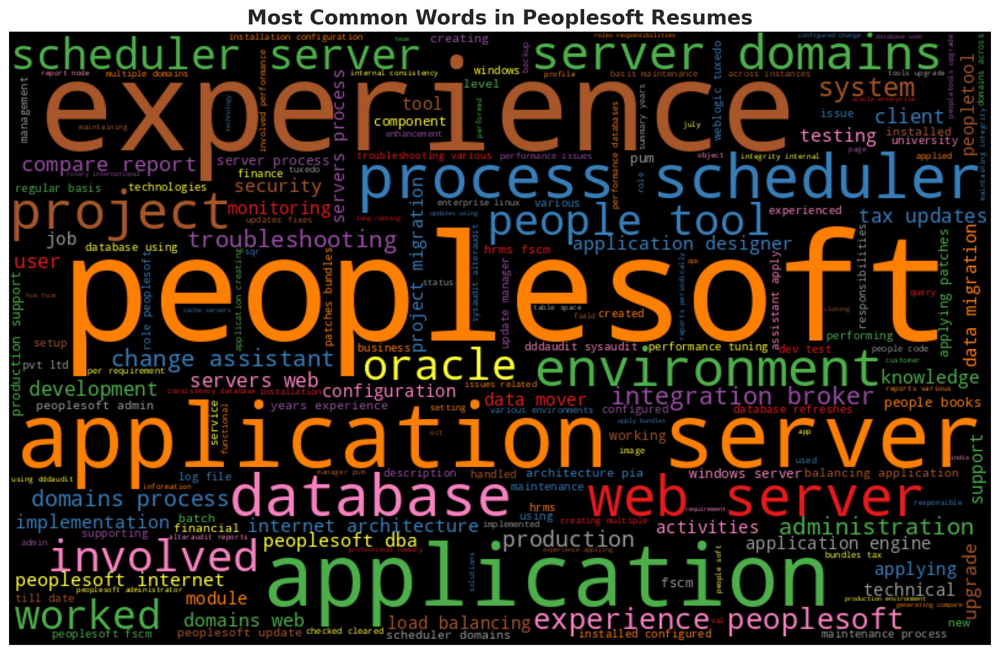

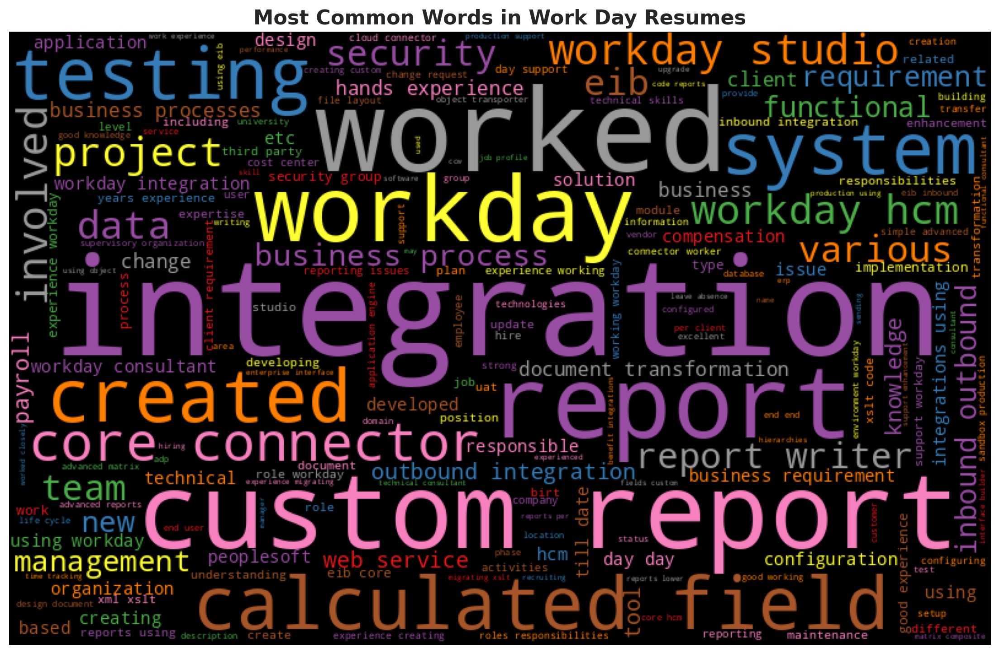

In [ ]:
def generate_wordcloud(all_words, Profile):
    wordcloud = WordCloud(width=800, height=500,
                          background_color='black',max_words=200,colormap='Set1').generate(all_words)

    plt.figure(figsize=(14, 10), dpi=200)
    plt.imshow(wordcloud)
    plt.axis('off')
    plt.title('Most Common Words in {} Resumes'.format(Profile), fontsize = 16, fontweight = 'bold')
    plt.show()

for profiles in df3['Category'].unique():
    all_words = ' '.join([text for text in df3['Cleaned_data'][df3['Category'] == profiles]])
    generate_wordcloud(all_words, profiles)

In [ ]:
categories = np.sort(df3['Category'].unique())

df3_categories = [df3[df3['Category'] == category].loc[:, ['Cleaned_data', 'Category']] for category in categories]

In [ ]:
def wordfreq(df3):
    count = df3['Cleaned_data'].str.split(expand=True).stack().value_counts().reset_index()
    count.columns = ['Word', 'Frequency']

    return count.head(10)

ValueError: ignored

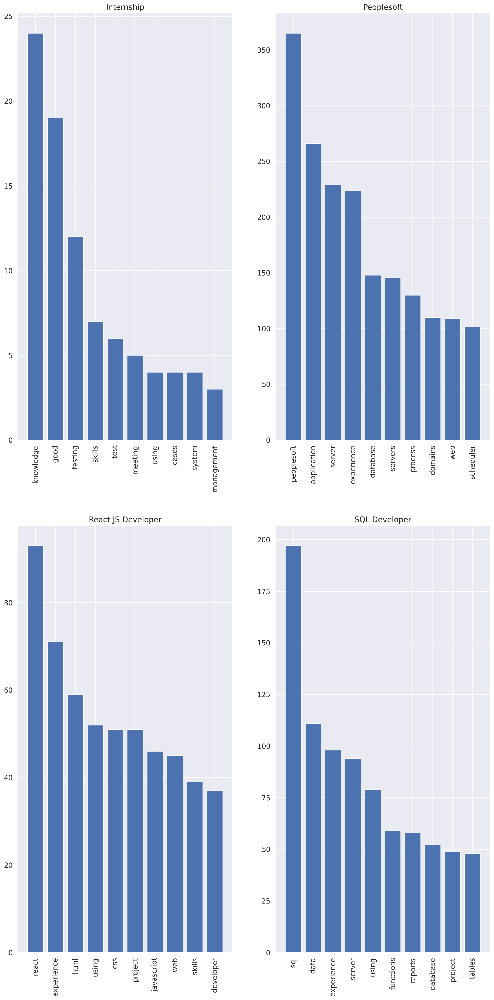

In [ ]:
fig = plt.figure(figsize=(16, 32), dpi=200)

for i, category in enumerate(categories):
    wf = wordfreq(df3_categories[i])

    fig.add_subplot(2, 2, i + 1).set_title(category)
    plt.bar(wf['Word'], wf['Frequency'])
    plt.xticks(rotation=90)

plt.show()

# 4.5] N-grams
- ### Extract Unigrams & Bigrams from our resumes using the ngrams function of the textblob library.

In [ ]:
TextBlob(df3['Cleaned_data'][1]).ngrams(1)[:20]

[WordList(['susovan']),
 WordList(['bag']),
 WordList(['seeking']),
 WordList(['challenging']),
 WordList(['position']),
 WordList(['field']),
 WordList(['science']),
 WordList(['technology']),
 WordList(['utilize']),
 WordList(['skills']),
 WordList(['organization']),
 WordList(['individual']),
 WordList(['growth']),
 WordList(['enhance']),
 WordList(['knowledge']),
 WordList(['academic']),
 WordList(['learning']),
 WordList(['give']),
 WordList(['best']),
 WordList(['organization'])]

In [ ]:
TextBlob(df3['Cleaned_data'][1]).ngrams(2)[:20]

[WordList(['susovan', 'bag']),
 WordList(['bag', 'seeking']),
 WordList(['seeking', 'challenging']),
 WordList(['challenging', 'position']),
 WordList(['position', 'field']),
 WordList(['field', 'science']),
 WordList(['science', 'technology']),
 WordList(['technology', 'utilize']),
 WordList(['utilize', 'skills']),
 WordList(['skills', 'organization']),
 WordList(['organization', 'individual']),
 WordList(['individual', 'growth']),
 WordList(['growth', 'enhance']),
 WordList(['enhance', 'knowledge']),
 WordList(['knowledge', 'academic']),
 WordList(['academic', 'learning']),
 WordList(['learning', 'give']),
 WordList(['give', 'best']),
 WordList(['best', 'organization']),
 WordList(['organization', 'skills'])]

In [ ]:
TextBlob(df3['Cleaned_data'][1]).ngrams(3)[:20]

[WordList(['susovan', 'bag', 'seeking']),
 WordList(['bag', 'seeking', 'challenging']),
 WordList(['seeking', 'challenging', 'position']),
 WordList(['challenging', 'position', 'field']),
 WordList(['position', 'field', 'science']),
 WordList(['field', 'science', 'technology']),
 WordList(['science', 'technology', 'utilize']),
 WordList(['technology', 'utilize', 'skills']),
 WordList(['utilize', 'skills', 'organization']),
 WordList(['skills', 'organization', 'individual']),
 WordList(['organization', 'individual', 'growth']),
 WordList(['individual', 'growth', 'enhance']),
 WordList(['growth', 'enhance', 'knowledge']),
 WordList(['enhance', 'knowledge', 'academic']),
 WordList(['knowledge', 'academic', 'learning']),
 WordList(['academic', 'learning', 'give']),
 WordList(['learning', 'give', 'best']),
 WordList(['give', 'best', 'organization']),
 WordList(['best', 'organization', 'skills']),
 WordList(['organization', 'skills', 'ccna'])]

## 4.5.1] Count Vectorizer on N-grams

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

c_vec = CountVectorizer(stop_words=stopwords.words('english'), ngram_range=(1,2))
# matrix of ngrams- unigrams &bigrams(1,2)

ngrams = c_vec.fit_transform(df3['Cleaned_data'])
# count frequency of ngrams

count_values = ngrams.toarray().sum(axis=0)
# list of ngrams

vocab = c_vec.vocabulary_
df_ngram = pd.DataFrame(sorted([(count_values[i],k)
                                for k,i in vocab.items()],
                                 reverse=True)).rename(columns={0: 'Frequency', 1:'Unigram/Bigram'})

In [ ]:
fig = px.bar(df_ngram.head(10), y = 'Unigram/Bigram', x = 'Frequency',
                                        text = 'Frequency', color = 'Frequency',
                                               title = 'Top 20 Most used Words in Resumes')

fig.update_xaxes(tickangle=-90)
fig.update_layout( title_x = 0.5)

# 4.6] Named Entity Recognition (NER)

In [ ]:
import string


oneSetOfStopWords = set(stopwords.words('english')+['``',"''"])
totalWords =[]
Sentences = df3['Cleaned_data'].values
cleanedSentences = ""

for records in Sentences:
    cleanedText = preprocess(records)
    cleanedSentences += cleanedText
    requiredWords = nltk.word_tokenize(cleanedText)
    for word in requiredWords:
        if word not in oneSetOfStopWords and word not in string.punctuation:
            totalWords.append(word)

In [ ]:
## Part Of Speech Tagging
nlp = spacy.load('en_core_web_sm')

one_block=cleanedSentences[:3000]
#slicing of row

doc_block=nlp(one_block)
spacy.displacy.render(doc_block,style='ent',jupyter=True)

In [ ]:
for token in doc_block[:50]:
    print(token,token.pos_)

name PROPN
ravali PROPN
curriculum NOUN
vitae NOUN
specialization NOUN
computer NOUN
science NOUN
engg PROPN
utilize VERB
technical ADJ
skills NOUN
achieving VERB
target NOUN
developing VERB
best ADJ
performance NOUN
organization NOUN
manual ADJ
testing NOUN
skills VERB
strong ADJ
knowledge NOUN
sdlc NOUN
concepts VERB
extensive ADJ
knowledge NOUN
white PROPN
box PROPN
testing VERB
good ADJ
knowledge NOUN
functional ADJ
testing NOUN
integration NOUN
testing NOUN
extreme ADJ
knowledge NOUN
system NOUN
testing VERB
good ADJ
knowledge NOUN
adhoc ADJ
testing NOUN
reliability NOUN
testing VERB
good ADJ
knowledge NOUN
exploratory ADJ
testing VERB
good ADJ


# 4.7] Dealing with nouns and verbs

In [ ]:
# Filtering the nouns and verbs only

one_block=cleanedSentences
doc_block=nlp(one_block)
nouns_verbs=[token.text for token in doc_block if token.pos_ in ('NOUN','VERB')]
print(nouns_verbs[100:200])

['sjbit', 'bengaluru', 'certified', 'volleyball', 'olympics', 'distict', 'level', 'assignements', 'identified', 'test', 'cases', 'flipkart', 'com', 'identified', 'integration', 'test', 'cases', 'whatsapp', 'identified', 'integration', 'test', 'cases', 'found', 'defects', 'usability', 'camaptibility', 'globalization', 'testing', 'strengths', 'date', 'birth', 'gender', 'father', 'name', 'languages', 'known', 'telugu', 'declare', 'mentioned', 'information', 'knowledge', 'ravali', 'place', 'bag', 'seeking', 'challenging', 'position', 'field', 'science', 'technology', 'utilize', 'skills', 'organization', 'growth', 'enhance', 'knowledge', 'learning', 'give', 'organization', 'skills', 'ccna', 'routing', 'switching', 'subnetting', 'programming', 'oops', 'algorithms', 'data', 'structures', 'dbms', 'networking', 'administration', 'troubleshooting', 'skills', 'leadership', 'collaboration', 'communication', 'customer', 'handling', 'skills', 'languages', 'telugu', 'projects', 'agriculture', 'built'

## 4.7.1] Counting all the nouns and verbs present in tokens above

In [ ]:
# Counting the noun & verb tokens
from sklearn.feature_extraction.text import CountVectorizer
cv=CountVectorizer()

X=cv.fit_transform(nouns_verbs)
sum_words=X.sum(axis=0)

words_freq=[(word,sum_words[0,idx]) for word,idx in cv.vocabulary_.items()]
words_freq=sorted(words_freq, key=lambda x: x[1], reverse=True)

wd_df=pd.DataFrame(words_freq)
wd_df.columns=['word','count']
wd_df[0:10]
# top 10 noun & verb

,word,count
0,experience,513
1,using,355
2,application,348
3,server,317
4,reports,309
5,data,279
6,business,243
7,project,227
8,process,218
9,database,210


- ### Visualizing the Result of Top 10 nouns and verbs most frequently present in the Resumes

In [ ]:
# Top 10 nouns & verbs
fig = px.bar(wd_df.head(10), x = 'word', y = 'count',
                           hover_name = 'word', text = 'count',
                               color = 'count', title = 'Top 10 nouns & verbs')

fig.update_xaxes(tickangle=-90)
fig.update_layout( title_x = 0.5)

# 4.8] Bag of Words (BOW)
- ### without N grams

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

cv=CountVectorizer()
resumecv =cv.fit_transform(requiredWords)

In [ ]:
print(cv.vocabulary_)

{'vinay': 257, 'kumar': 122, 'workday': 262, 'functional': 94, 'consultant': 41, 'expertise': 88, 'summary': 221, 'years': 270, 'total': 239, 'experience': 86, 'knowledge': 121, 'modules': 145, 'core': 44, 'hcm': 101, 'supervisory': 222, 'organization': 158, 'delegation': 59, 'cost': 45, 'center': 20, 'locations': 130, 'security': 207, 'implementing': 106, 'integrations': 112, 'various': 255, 'including': 108, 'compensation': 30, 'time': 237, 'tracking': 242, 'absence': 1, 'management': 135, 'payroll': 165, 'benefits': 12, 'performance': 170, 'good': 97, 'groups': 99, 'role': 198, 'based': 11, 'user': 251, 'job': 119, 'experienced': 87, 'report': 189, 'writing': 267, 'custom': 49, 'reports': 191, 'simple': 212, 'advanced': 5, 'matrix': 138, 'composite': 33, 'calculated': 18, 'fields': 91, 'eib': 72, 'connectors': 40, 'xml': 268, 'xslt': 269, 'web': 258, 'services': 210, 'structure': 218, 'objects': 154, 'hands': 100, 'migrating': 142, 'code': 26, 'lower': 131, 'tenant': 233, 'sandbox':

In [ ]:
print(cv.get_feature_names_out()[109:200])

['independent' 'information' 'integration' 'integrations' 'interface'
 'interfaces' 'internal' 'interpersonal' 'involved' 'issues' 'job' 'keys'
 'knowledge' 'kumar' 'languages' 'layout' 'leadership' 'legacy' 'like'
 'loading' 'location' 'locations' 'lower' 'mahindra' 'maintain' 'managed'
 'management' 'mass' 'master' 'matrix' 'members' 'menus' 'microsoft'
 'migrating' 'modifications' 'modified' 'modules' 'monitor' 'monitored'
 'moving' 'multiple' 'narayana' 'needed' 'new' 'object' 'objects' 'one'
 'online' 'order' 'organization' 'organizations' 'outbound' 'output'
 'ownership' 'pages' 'payments' 'payroll' 'people' 'peoplesoft' 'per'
 'perform' 'performance' 'performing' 'personal' 'player' 'powerpoint'
 'process' 'processes' 'processing' 'production' 'professional' 'project'
 'prompt' 'publisher' 'queries' 'query' 'ran' 'ready' 'records'
 'relationships' 'report' 'reporting' 'reports' 'requests' 'requirement'
 'requirements' 'resolve' 'resolved' 'responsibilities' 'role' 'roles']


In [ ]:
print(cv.get_feature_names_out()[:100])

['ability' 'absence' 'account' 'activity' 'administration' 'advanced'
 'allowances' 'analyst' 'application' 'assign' 'bank' 'based' 'benefits'
 'best' 'building' 'built' 'bulk' 'business' 'calculated' 'calls' 'center'
 'challenge' 'change' 'changes' 'clarifications' 'client' 'code' 'college'
 'communication' 'company' 'compensation' 'component' 'components'
 'composite' 'concepts' 'configurable' 'configure' 'configured'
 'configuring' 'connector' 'connectors' 'consultant' 'contacts'
 'conversions' 'core' 'cost' 'created' 'csv' 'current' 'custom'
 'customers' 'customized' 'daily' 'data' 'date' 'day' 'declaration'
 'declare' 'definition' 'delegation' 'delivered' 'design' 'designation'
 'designed' 'develop' 'developed' 'development' 'different' 'document'
 'documents' 'edits' 'education' 'eib' 'eibs' 'emergency' 'employees'
 'enable' 'engine' 'engineering' 'engines' 'enhancements' 'errors' 'etc'
 'excel' 'excellent' 'existing' 'experience' 'experienced' 'expertise'
 'external' 'field' 'fi

In [ ]:
print(resumecv.toarray())

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


## 4.8.1] CountVectorizer with N-grams (Bigrams & Trigrams)

In [ ]:
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
from tqdm.notebook import tqdm_notebook

ps = PorterStemmer()
corpus_cv = []
for i in tqdm_notebook(range(0, len(df3))):
    text = re.sub('[^a-zA-Z]', ' ', df3['Cleaned_data'][i])
    text = text.lower()
    text = text.split()

    text = [ps.stem(word) for word in text if not word in stopwords.words('english')]
    text = ' '.join(text)
    corpus_cv.append(text)

  0%|          | 0/76 [00:00<?, ?it/s]

In [ ]:
df3['Cleaned_data'][1]

'susovan bag seeking challenging position field science technology utilize skills organization individual growth enhance knowledge academic learning give best organization skills ccna routing switching subnetting programming java html css sql oops algorithms data structures dbms networking linux linux system administration troubleshooting soft skills leadership collaboration good communication customer handling skills languages english fluent hindi fluent bengali native telugu projects smart agriculture built product farmers using iot solution automatic water motor controller iot android api technologies combined automate work water motor controllers using sensors bookstore management interface manage purchase return books books store hotel management system dec designed front end module hotel management system website using html css online movie ticket booking designed fully functioning website using html css javascript education background lovely professional university punjab india 

In [ ]:
corpus_cv[1]

'susovan bag seek challeng posit field scienc technolog util skill organ individu growth enhanc knowledg academ learn give best organ skill ccna rout switch subnet program java html css sql oop algorithm data structur dbm network linux linux system administr troubleshoot soft skill leadership collabor good commun custom handl skill languag english fluent hindi fluent bengali nativ telugu project smart agricultur built product farmer use iot solut automat water motor control iot android api technolog combin autom work water motor control use sensor bookstor manag interfac manag purchas return book book store hotel manag system dec design front end modul hotel manag system websit use html css onlin movi ticket book design fulli function websit use html css javascript educ background love profession univers punjab india tech comput scienc engin gpa hobbi web surf cricket carrom chess'

In [ ]:
## Applying Countvectorizer
# Creating the Bag of Words model

cv = CountVectorizer(max_features=5000,ngram_range=(1,3))
X = cv.fit_transform(corpus_cv).toarray()

In [ ]:
cv.get_feature_names_out()[:20]

array(['abil', 'abil work', 'abil work team', 'absenc', 'absenc manag',
       'academ', 'accentur', 'accept', 'accept level',
       'accept level statu', 'accept test', 'access', 'access peopl',
       'access peopl book', 'accord', 'accord chang',
       'accord chang request', 'account', 'account inform',
       'account inform cost'], dtype=object)

In [ ]:
cv.get_params()

{'analyzer': 'word',
 'binary': False,
 'decode_error': 'strict',
 'dtype': numpy.int64,
 'encoding': 'utf-8',
 'input': 'content',
 'lowercase': True,
 'max_df': 1.0,
 'max_features': 5000,
 'min_df': 1,
 'ngram_range': (1, 3),
 'preprocessor': None,
 'stop_words': None,
 'strip_accents': None,
 'token_pattern': '(?u)\\b\\w\\w+\\b',
 'tokenizer': None,
 'vocabulary': None}

In [ ]:
count_df = pd.DataFrame(X, columns=cv.get_feature_names_out())
count_df

,abil,abil work,abil work team,absenc,absenc manag,academ,accentur,accept,accept level,accept level statu,...,year,year experi,year experi develop,year experi peoplesoft,year experi workday,year extens,year month,year profession,year profession experi,year workday
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,1,1,0,0,0,0,0,0,0,0
3,0,0,0,0,0,2,0,0,0,0,...,2,1,0,0,0,0,0,0,0,0
4,0,0,0,0,0,1,0,0,0,0,...,1,1,0,0,0,0,0,0,0,0
5,1,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,1,0,0
6,0,0,0,0,0,0,0,0,0,0,...,1,1,0,0,0,0,0,0,0,0
7,1,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,1,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,1,1,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,2,1,0,0,0,0,0,0,0,0


# 4.9] TF-IDF Vectorizer

In [ ]:
ps = PorterStemmer()
corpus_tf = []
for i in tqdm_notebook(range(0, len(df3))):
    text = re.sub('[^a-zA-Z]', ' ', df3['Cleaned_data'][i])
    text = text.lower()
    text = text.split()

    text = [ps.stem(word) for word in text if not word in stopwords.words('english')]
    text = ' '.join(text)
    corpus_tf.append(text)

  0%|          | 0/76 [00:00<?, ?it/s]

In [ ]:
corpus_tf[1]

'susovan bag seek challeng posit field scienc technolog util skill organ individu growth enhanc knowledg academ learn give best organ skill ccna rout switch subnet program java html css sql oop algorithm data structur dbm network linux linux system administr troubleshoot soft skill leadership collabor good commun custom handl skill languag english fluent hindi fluent bengali nativ telugu project smart agricultur built product farmer use iot solut automat water motor control iot android api technolog combin autom work water motor control use sensor bookstor manag interfac manag purchas return book book store hotel manag system dec design front end modul hotel manag system websit use html css onlin movi ticket book design fulli function websit use html css javascript educ background love profession univers punjab india tech comput scienc engin gpa hobbi web surf cricket carrom chess'

In [ ]:
## TFidf Vectorizer
tfidf_v = TfidfVectorizer(max_features=5000,ngram_range=(1,3))
X = tfidf_v.fit_transform(corpus_tf).toarray()

In [ ]:
tfidf_v.get_feature_names_out()[:20]

array(['abil', 'abil work', 'abil work team', 'absenc', 'absenc manag',
       'academ', 'accentur', 'accept', 'accept level',
       'accept level statu', 'accept test', 'access', 'access peopl',
       'access peopl book', 'accord', 'accord chang',
       'accord chang request', 'account', 'account inform',
       'account inform cost'], dtype=object)

In [ ]:
tfidf_v.get_feature_names_out()[4980:]

array(['xpath', 'xslt', 'xslt code', 'xslt code per', 'xslt code report',
       'xslt differ', 'xslt present', 'xslt present data', 'xtt',
       'xtt function', 'year', 'year experi', 'year experi develop',
       'year experi peoplesoft', 'year experi workday', 'year extens',
       'year month', 'year profession', 'year profession experi',
       'year workday'], dtype=object)

In [ ]:
tfidf_v.get_params()

{'analyzer': 'word',
 'binary': False,
 'decode_error': 'strict',
 'dtype': numpy.float64,
 'encoding': 'utf-8',
 'input': 'content',
 'lowercase': True,
 'max_df': 1.0,
 'max_features': 5000,
 'min_df': 1,
 'ngram_range': (1, 3),
 'norm': 'l2',
 'preprocessor': None,
 'smooth_idf': True,
 'stop_words': None,
 'strip_accents': None,
 'sublinear_tf': False,
 'token_pattern': '(?u)\\b\\w\\w+\\b',
 'tokenizer': None,
 'use_idf': True,
 'vocabulary': None}

In [ ]:
tfidf_df = pd.DataFrame(X, columns=tfidf_v.get_feature_names_out())
tfidf_df

,abil,abil work,abil work team,absenc,absenc manag,academ,accentur,accept,accept level,accept level statu,...,year,year experi,year experi develop,year experi peoplesoft,year experi workday,year extens,year month,year profession,year profession experi,year workday
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.000000,0.000000,0.000000,0.000000,0.000000,0.083372,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.008782,0.011976,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,0.000000,0.000000,0.000000,0.000000,0.000000,0.049838,0.000000,0.000000,0.000000,0.000000,...,0.017949,0.012239,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,0.000000,0.000000,0.000000,0.000000,0.000000,0.062446,0.000000,0.000000,0.000000,0.000000,...,0.022490,0.030669,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
5,0.033932,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.019460,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.060370,0.000000,0.000000
6,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.004988,0.006802,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.016416,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.009415,0.000000,0.000000,0.000000,0.000000,0.000000,0.032098,0.000000,0.000000,0.000000
8,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.006882,0.009385,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.025972,0.017709,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [ ]:
ps = PorterStemmer()
corpus = []
for i in tqdm_notebook(range(0, len(df3))):
    text = re.sub('[^a-zA-Z]', ' ', df3['Cleaned_data'][i])
    text = text.lower()
    text = text.split()

    text = [ps.stem(word) for word in text if not word in stopwords.words('english')]
    text = ' '.join(text)
    corpus.append(text)


word_vectorizer = TfidfVectorizer(sublinear_tf=True,stop_words='english',max_features=5000,ngram_range=(1,3))

tfidf = word_vectorizer.fit(corpus)
WordFeatures = word_vectorizer.transform(corpus).toarray()


tfidf_df = pd.DataFrame(WordFeatures, columns=tfidf.get_feature_names_out())
tfidf_df

  0%|          | 0/76 [00:00<?, ?it/s]

,abil,abil work,abil work team,absenc,absenc manag,academ,accentur,accept,accept level,accept level statu,...,year,year experi,year experi develop,year experi peoplesoft,year experi workday,year extens,year month,year profession,year profession experi,year workday
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.000000,0.000000,0.000000,0.000000,0.000000,0.097649,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.013151,0.017934,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,0.000000,0.000000,0.000000,0.000000,0.000000,0.069574,0.000000,0.000000,0.000000,0.000000,...,0.025058,0.020182,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,0.000000,0.000000,0.000000,0.000000,0.000000,0.075306,0.000000,0.000000,0.000000,0.000000,...,0.027122,0.036985,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
5,0.041406,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.023747,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.073669,0.000000,0.000000
6,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.010057,0.013715,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.027655,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.015860,0.000000,0.000000,0.000000,0.000000,0.000000,0.054075,0.000000,0.000000,0.000000
8,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.011488,0.015666,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.029162,0.023487,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


- We need to convert textual representation in the form on numeric features. We have two popular techniques to perform feature extraction:

- Bag of words (Simple vectorization)
- TF-IDF (Term Frequency - Inverse Document Frequency)
- We will use extracted features from both one by one to perform sentiment analysis and will compare the result at last.

- A. Feature Extraction for 'Key Words'

In [ ]:
# BOW features
bow_word_vectorizer = CountVectorizer(max_df=0.90, min_df=2, stop_words='english')

# bag-of-words feature matrix
bow_word_feature = bow_word_vectorizer.fit_transform(df3['Cleaned_data'])

# TF-IDF features
tfidf_word_vectorizer = TfidfVectorizer(max_df=0.90, min_df=2, stop_words='english')

# TF-IDF feature matrix
tfidf_word_feature = tfidf_word_vectorizer.fit_transform(df3['Cleaned_data'])

In [ ]:
df3.to_csv('Resume cleaned.csv', index = False)

In [ ]:
tfidf_df.to_csv('Resume TF-IDF.csv', index = False)

In [ ]:
import pickle

pickle.dump(tfidf, open("tfidf.pkl", "wb"))